# Unsupervised Learning Predict Student Solution

© Explore Data Science Academy



## Introduction

You must have one time in your life wondered how your favourite browsers always give u a certain kinds of content as suggested view list, or how when you go on youtube to watch a video, and even before you search for anything you already have some suggested contents. Well this is no magic, neither is it a coincidence, the answer to the questions that might have lingered in your mind is recommender systems. In the examples given above, the recommendations comes from your previous searches or viewing history, of videos or contents you have given a thumbs up (in the context of `YouTube`). These search engines use a kind of machine learning algorithm known as recommender systems to give suggestions of coontents they feel would appeal to a user, and these systems are built by logically computing the similarity of contents previously viewed and enjoyed by a user and then suggesting those contents that are very similar to them.

In this Notebook we seek to exploit the several methods these recommender systems are built, and for this purpose we would be using a movies dataset that contains over 63 thousand movie collections and over 10,000,000 user ratings of these movies. 

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [1]:
# Libraries for data loading, data manipulation and data visulisation
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from wordcloud import WordCloud
import numpy as np
import operator
import heapq

# Libraries for data preparation and model building
from sklearn.linear_model import LinearRegression
from surprise import SVD
from surprise import Reader, Dataset
from surprise.model_selection import cross_validate
from surprise import NormalPredictor
from surprise import KNNBasic
from surprise import KNNWithMeans
from surprise import KNNWithZScore
from surprise import KNNBaseline
from surprise import SVD
from surprise import BaselineOnly
from surprise import SVDpp
from surprise import NMF
from surprise import SlopeOne
from surprise import CoClustering
from surprise.accuracy import rmse
from surprise import accuracy
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics.pairwise import linear_kernel
from comet_ml import Experiment
import scipy as sp
import pickle


# allows for viewing of all the columns and rows in the dataset
pd.set_option('max_rows', None)
pd.set_option('max_columns', None)

# Setting global constants to ensure notebook results are reproducible
#PARAMETER_CONSTANT = ###

In [2]:
# Create an experiment with your api key
experiment = Experiment(
    api_key="zqRChWTAouaIFtuzOWivpPhYN",
    project_name="unsupervised-learning-team2",
    workspace="gogzicole",
)

COMET WARNING: Comet has disabled auto-logging functionality as it has been imported after the following ML modules: sklearn. Metrics and hyperparameters can still be logged using comet_ml.log_metrics() and comet_ml.log_parameters()
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Experiment is live on comet.ml https://www.comet.ml/gogzicole/unsupervised-learning-team2/e700d74c66e241b48f043e9d6f4449d0

COMET ERROR: Error logging git-related information


<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `df_train` file into a DataFrame. |

---

In [2]:
# load all the data using pandas read_csv method
train = pd.read_csv('train.csv')
genome_score = pd.read_csv('genome_scores.csv')
genome_tags = pd.read_csv('genome_tags.csv')
imdb = pd.read_csv('imdb_data.csv')
links = pd.read_csv('links.csv')
movies = pd.read_csv('movies.csv')
tags = pd.read_csv('tags.csv')
test = pd.read_csv('test.csv')
submission = pd.read_csv('sample_submission.csv')

**About the Dataset**

The dataset is made of thousands of movies and millions of user ratings and it's attributes dating back to 1975. we have these attributes stored in separate csv files and as such would need to join some of the data to extract the atributes. Some of the attributes we expect to see are;

**1. the movie's name**

**2. the movies's genre**

**3. the movies's producer and crew**

**4. the movies's ratingy viewers**

**5. the movies's production year**

**6. tags associated with the movies, etc**

up next we would take a closer look at the individual datasets and try and make sense out of the informations contained in each. we shall perfom analysis on each data as a single unit and then join some of them to derive more insight


<a id="three"></a>
## 3. Exploratory Data Analysis (EDA) and Cleaning the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, you are required to perform an in-depth analysis of all the variables in the DataFrame. |

---


**Train Data**

In [7]:
# checkout first five columns of train data
train.head()

,userId,movieId,rating,timestamp
0,5163,57669,4.0,1518349992
1,106343,5,4.5,1206238739
2,146790,5459,5.0,1076215539
3,106362,32296,2.0,1423042565
4,9041,366,3.0,833375837


In [5]:
# check if train data has missing values 
train.isna().sum()

userId       0
movieId      0
rating       0
timestamp    0
dtype: int64

In [6]:
# check the summary statistics of the ratings feature
train['rating'].describe().round(1)

count    10000038.0
mean            3.5
std             1.1
min             0.5
25%             3.0
50%             3.5
75%             4.0
max             5.0
Name: rating, dtype: float64

In [6]:
# check the amount of features and observations in train data
train.shape

(10000038, 4)

In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000038 entries, 0 to 10000037
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   userId     int64  
 1   movieId    int64  
 2   rating     float64
 3   timestamp  int64  
dtypes: float64(1), int64(3)
memory usage: 305.2 MB


The train data has **4 features**, `userId`, `movieId`, `rating` and `timestamp` and **10000038 observations**. al the data are numerical of type `float64` and `int64`. The userId represent the unique identifier for each user in the movie's rating utility table, while the movieId represent the unique identifier for each movie present in the matrix, the rating represents a numerical value of how much a user rates a movie they have seen, with a rating 0.5 as the minimum and a raring of 5.0 as the maximum.

From the statistical checks above we could see that there are no missing values in the train data and that a single user can have ratings for different movies, but can't have multiple ratings for a single movie.

Next, lets make use of visualizations to view the distribution of ratings in the data

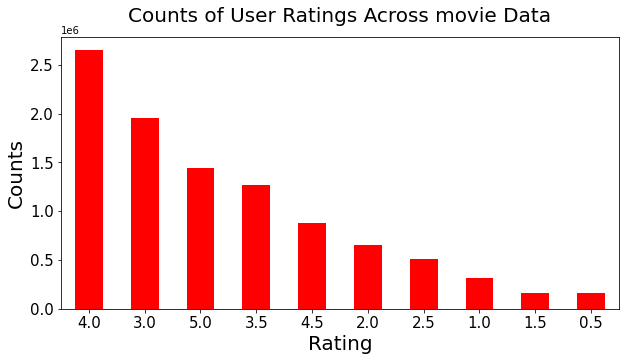

In [8]:
# create pie chart using the user ratings from train data
train.rating.value_counts().plot(kind = 'bar', fontsize = 15,
                               color = 'red', rot = 'horizontal',
                               figsize = (10,5));
# name the axis and also the plot
plt.xlabel('Rating', size =20);
plt.ylabel('Counts', size = 20);
plt.title('Counts of User Ratings Across movie Data', size = 20, pad = 15);

We can see clearly from the bar plot that most users gave a `4 star` rating to the movies, which represent about, `26.5%` of the whole movie dataset and the least ratings of `0.5`, `1.5`., and `1.0` represent just `7%` of the train data, this can be seen clearly from the pie chart below

Text(0.5, 1.0, 'Proportion of User Ratings Across movie Data')

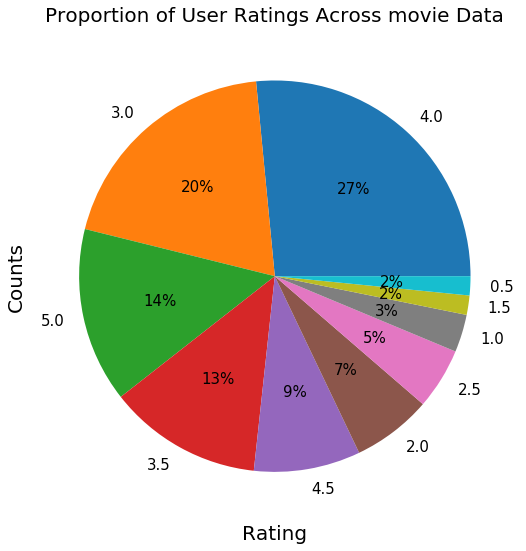

In [3]:
# create pie chart using the user ratings from train data
train.rating.value_counts().plot(kind = 'pie', fontsize = 15,
                               rot = 'horizontal',
                               figsize = (12,9),autopct = '%1.0f%%');
# name the axis and also the plot
plt.xlabel('Rating', size =20);
plt.ylabel('Counts', size = 20);
plt.title('Proportion of User Ratings Across movie Data', size = 20, pad = 10)

To make more sense out of the train data we would need to add additional informations like the names of each movie represented by the movieid's, the production year and also the genres associated with each movie. These attributes can help us determine what `genres` are most porpularly rated among users, what movies got the highest ratings in a specific year.

To get these information, we would need to merge the movies table to the train table on userId, but firs let us do some EDA on the movies table.

**Movies Table**

In [9]:
# view the first five rows of the data
movies.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [7]:
# view the number of rows and columns of the movie data
movies.shape

(62423, 3)

In [23]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62423 entries, 0 to 62422
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   movieId  62423 non-null  int64 
 1   title    62423 non-null  object
 2   genres   62423 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.4+ MB


The movies data has `62423` observations and `3` columns, the `title` column and the `genres` column are in text format, and contains the title of movies and the genres respectively. The `movieId` column contains the integer proxy of each unique movie contained in the `title` columns.

One major thing to observe from the title column is that each title has the year the movie was release in bracket as part of the name, one thing we can do is extract the years from each movie. Also we can observe that each movie can have up to about 2 or more genres associated with it. Currently we do not know the exact amount of unique genres in the movies dataset, this is because the genres are all written together separated by a |, let us device a function to clean the data and then count the unique genres in the movie.

We could also note that the data contains no missing values and since the movieId is a unique identifier for each movie, we can deduce that there a total of 62423 movies present in the dataset. Now let us go ahead and extract the years from the dataset and do some movie specific analysis. 

Before we do these, we need to do some mofification on the genres column so that while tokenizing the words, words like "Sci-Fi" won't be counted individually as "Sci" and "Fi".

In [3]:
## function to change "Sci-Fi" to "Sci_Fi", "Film-Noir" to 'Film_Noir' and '(no genres listed)' to 'no_genres_listed' in genres
def change_genre(genre):
    # dictionary to map old and new name
    dct_ = {'Sci-Fi':'Sci_Fi','Film-Noir':'Film_Noir',
            '(no genres listed)':'no_genres_listed'}
    lst = [] # list to store genres in genre
    # iterate inside of the the genre in each row
    for i in genre:
        # change only the words in the dict_
        if i in dct_.keys():
            i = dct_[i]
            lst.append(i)
        else:
            # leave other words as they are
            i = i
            lst.append(i)
    # return genre strings
    return " ".join(lst)

In [4]:
# Create year column by extracting the year from the movie name
movies['year'] = movies.title.apply(lambda x: x[-6:])
#Some movies dont have release year, so we replace the string
#extracted from the top with an empty string, use regex to remove non numeric characters
movies['year'] = movies['year'].replace('\D','', regex=True)
#some number in movie names were collected remove them
movies['year'] = movies['year'].apply(lambda x: ''.join([x if len(x) >= 4 else '']))
# Replace the poles seperating the genres of a movie with a comma and convert to list
movies['genres'] = movies.genres.apply(lambda x: x.split('|'))
# apply the change genre function on the genre column
movies['genres'] = movies.genres.apply(change_genre)

# view first five rows of the modified movies data
movies.head()

,movieId,title,genres,year
0,1,Toy Story (1995),Adventure Animation Children Comedy Fantasy,1995
1,2,Jumanji (1995),Adventure Children Fantasy,1995
2,3,Grumpier Old Men (1995),Comedy Romance,1995
3,4,Waiting to Exhale (1995),Comedy Drama Romance,1995
4,5,Father of the Bride Part II (1995),Comedy,1995


In [28]:
# chek for the number of unique genres in the movie
# container to store genres( we use set so no one genre would be counted twice)
def unique_genre(x):
    genre_store = set()
    for i in range(x.shape[0]):
        # iterate inside of all the genres in the data
        for genres in x.genres.values[i].split():
            # add each genre to the set
            genre_store.update({genres})
    print("The Total Number of Unique Genres in the Dataset are: {}".format(len(genre_store)))
unique_genre(movies)

The Total Number of Unique Genres in the Dataset are: 20


From the result above, we can deduced that there are a total of **20** unique genres in the dataset, but what we dont know is in what proportions these genres are spread across the dataset, One common way to see this is by using a very popular visualization tool called wordcloud. Worcloud plots the texts in a given doument by representing the more prevalent text using A bigger font size, i.e words that are more frequent would be bolder than the less frequent words.

Another wway to visualize the most frequent genres is to make a bar plot of all the genres on one axis and the respective count of each genre on the other axis.

Below we implement the two visualization techniques, for the wordcloud plot we have created a function to help implement this plot on our dataset.

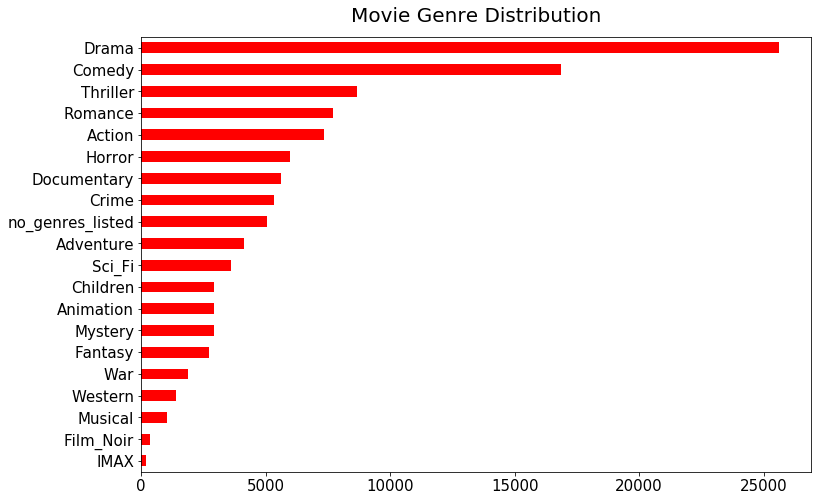

In [11]:
#List to store genres
genres = []
#iterate through the entire legth of the data
for i in range(movies.shape[0]):
    #iterate inside every row to get genres
    for genre in movies.genres.values[i].split():
        #append the genres to the genres list
        genres.append(genre)
#convert genres to array
genres = np.array(genres)
#convert genre array to series to use value_counts method
genre_series = pd.Series(genres, index = range(len(genres)))
#plot the genres series data
genre_series.value_counts().sort_values().plot(kind = 'barh', color = 'red',
                figsize =(12,8),
                fontsize = 15);
#assign title to plot
plt.title('Movie Genre Distribution', size = 20, pad = 15);

In [19]:
## function to plot genres present in the dataset
def word_cloud(data_,col_name):
    # Create a variable to store the text
    data = data_[col_name].values
    text = " ".join(word for word in data)
    # Instantiate wordcloud object
    word_cloud = WordCloud(collocations =False,
                          background_color = 'black',
                          width=400, 
                          height=300, 
                          contour_width=2, 
                          contour_color='steelblue')
    # generate wordcloud images
    word_cloud.generate(text)
    # Create Plot
    
    plt.figure(figsize =(10,10))
    plt.imshow(word_cloud, interpolation ='bilinear' )
    plt.axis('off')
    plt.title('Occurence of {} in the Movies Dataset'.format(col_name.capitalize()), size = 25, pad =15)
    plt.show()

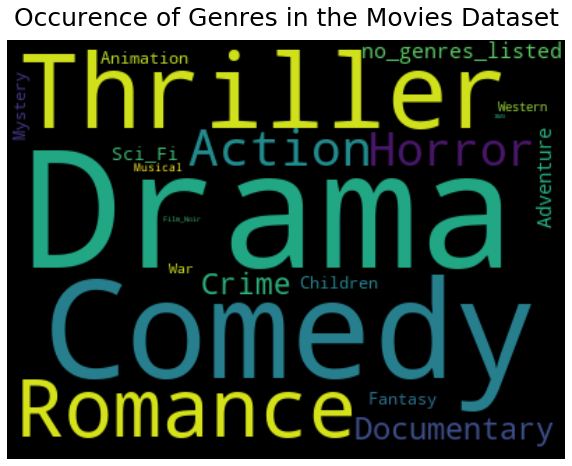

In [7]:
#show the plot
word_cloud(movies, 'genres')

As previously mentioned words that are more frequent would have a larger fontsize than less frequent words, from the plot we can see that in the movies dataset, `genres` like `Comedy`, `Thriller`, `Drama` are more popular, while genres like `Action`, `Romance`, `Crime` and `Horror` sit in the middle class, `genres` like `Animation` `Adventure`, `Children`, `Fantacy` make up the least popular. One thing that is worthy of note here again is the `genre` `no_genres_listed`, these represents those movies for which there are no genres listed for them.

The visuals shown in the wordcloud is supported by the barplot, where we can see not just the highest occuring genres but also a numerical value to support the claim. From we plot we could see that `Drama` supercedes the other genres as it has an occurnce of over `25000` hits across the movies dataset, as compared to `Imax` which has a little over `8` occurence in total.

Next we can show the top n movies that are represented by the top n genres in the dataset, let's try and impliment this using codes.

In [5]:
def get_movie_names(data, genre_name):
    
    # set to store movie names
    set_ = set()
    # iterate inside the rows and columns of the movies data
    data = data[['title','genres']]
    for ind, col in data.iterrows():
       # check if the movie has that genre in its genre list
        if genre_name in col['genres'].split():
            # append the movie name to the list
            set_.update({col['title']})

    return list(set_)
# show movies that have no genre associated with them
get_movie_names(movies,'Action')

['Invitation to a Gunfighter (1964)',
 'Battle of the Bulge (1965)',
 'The Last Warrior (1984)',
 'Kung Fu Yoga (2016)',
 'Deathstalker and the Warriors from Hell (1988)',
 'The Advocate: A Missing Body (2015)',
 'Thomas Crown Affair, The (1999)',
 'Rise of the Planet of the Apes (2011)',
 'Patriot Games (1992)',
 'Kite (1998)',
 'Dangerous Encounters of the First Kind (1980)',
 'Bank Job, The (2008)',
 'Billy the Kid vs. Dracula (1966)',
 'Dick Tracy vs. Cueball (1946)',
 'Thor (2011)',
 'Thunderball (1965)',
 'Chappie (2015)',
 'Poseidon Rex (2014)',
 'Predator 2 (1990)',
 'Pompeii (2014)',
 'Getaway, The (1972)',
 'Un Poliziotto Scomodo (1978)',
 'Female Fight Club (2017)',
 'Death Machine (1995)',
 'Message from Space (Uchu Kara no Messeji) (Return to Jelucia) (1978)',
 'Scabbard Samurai (2011)',
 'The Sword Stained with Royal Blood (1981)',
 'Absolon (2003)',
 'Rudhramadevi (2015)',
 'Killer Elite, The (1975)',
 'Doublecrossed (1991)',
 'The Salzburg Connection (1972)',
 'Children

By Imputing the Genre name inside of the get_movie_names function, we can see the movies that are associated with that genre.
The relevance of this function is that we can use it as a sub filter after making recommendations for a user to specify the search preference down to the particular genre they would like to watch. 

With the Analysis of the `Movies` table done, we can go ahead and join it with the train data so we can associate the user rating of each movie. to do this we would perfom an inner merge of the two tables using the common column in both table `movieId` as the `key`.

## Joining Train Data and Movies Data

In [7]:
# merge train and movie data on movieId and sort the table
train_joined = pd.merge(train.drop(columns = 'timestamp'),movies, how = 'inner', on = 'movieId').sort_values(by = ['userId','movieId'])
# confirm if joined table has the correct amount of observations
print(train_joined.shape)
# view first five rows of joined table
train_joined.head()

(10000038, 6)


,userId,movieId,rating,title,genres,year
502801,1,296,5.0,Pulp Fiction (1994),Comedy Crime Drama Thriller,1994
6852635,1,665,5.0,Underground (1995),Comedy Drama War,1995
6086993,1,899,3.5,Singin' in the Rain (1952),Comedy Musical Romance,1952
6325668,1,1175,3.5,Delicatessen (1991),Comedy Drama Romance,1991
5047680,1,1217,3.5,Ran (1985),Drama War,1985


## Top n Rated Movie By Year

Here we want to show the movies that got the highest user ratings across the years. The computation is done by adding all the unique user ratings for a particular movie and then returning the movies that has the highest cummulatuve ratings for that year.

Below is a function to help perform this computation, followed by a simple bar graph showing the top 20 rated movies in the movies data

**Note**

The result showed here might not be the actual representation of the cummulative ratings of each movie, as the release_year data is no available for all the movies, and hence thise movies mould not be counted in the computation process.

In [23]:
# function to calculate the most rated movie in a specific year
def movie_by_year(data, year):
    # select specific year
    df = data[data['year'] == year]
    df = df[['rating','title']]
    # dictionary to store total ratings and movie name
    dict_ = {}
    # iterate inside the data to get rating scores
    for ind, cols in df.iterrows():
        # if movie is not in the dictionary, add it to the dict
        if cols['title'] not in dict_.keys():
            dict_[cols['title']] = 0
        # add the user ratings for each movie
        dict_[cols['title']] += cols['rating']
    # sort the dictionary and return top 20 rated movies
    sorted_ = {k:v for k,v in sorted(dict_.items(), key = lambda x: x[1], reverse = True)[:20]}
    # create dataframe of the top 20 rated movies
    df = pd.DataFrame({'Movies': sorted_.keys(),
                       'Ratings': sorted_.values()}).set_index('Movies').sort_values(by = 'Ratings', ascending = True)
    return df

In [24]:
movie_1995 = movie_by_year(train_joined, '1995')
movie_1995.head()

,Ratings
Movies,
Dead Man Walking (1995),29565.5
While You Were Sleeping (1995),30815.5
Sense and Sensibility (1995),31078.0
Waterworld (1995),31462.5
Jumanji (1995),31505.0


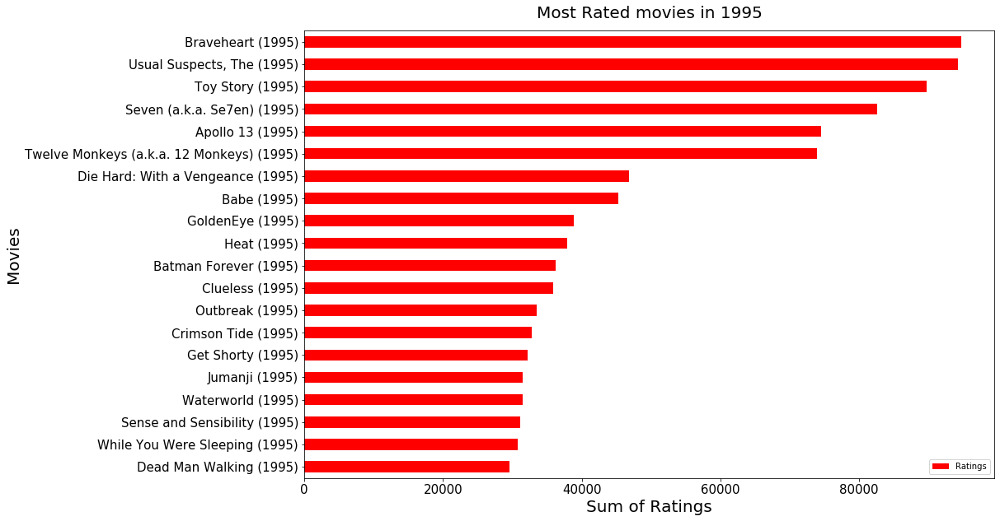

In [9]:
#call the function for year 1995
movie_1995 = movie_by_year(train_joined, '1995')
#plot the data
movie_1995.plot(kind = 'barh', color = 'red',
                figsize =(15,10),
                fontsize = 15)
#name the axis and also the plot
plt.xlabel('Sum of Ratings', size =20);
# name the y label and increase fontsize
plt.ylabel('Movies', size = 20);
# give title to plot
plt.title('Most Rated movies in 1995', size = 20, pad = 15);

The bar graph above and the ones that follow below were 

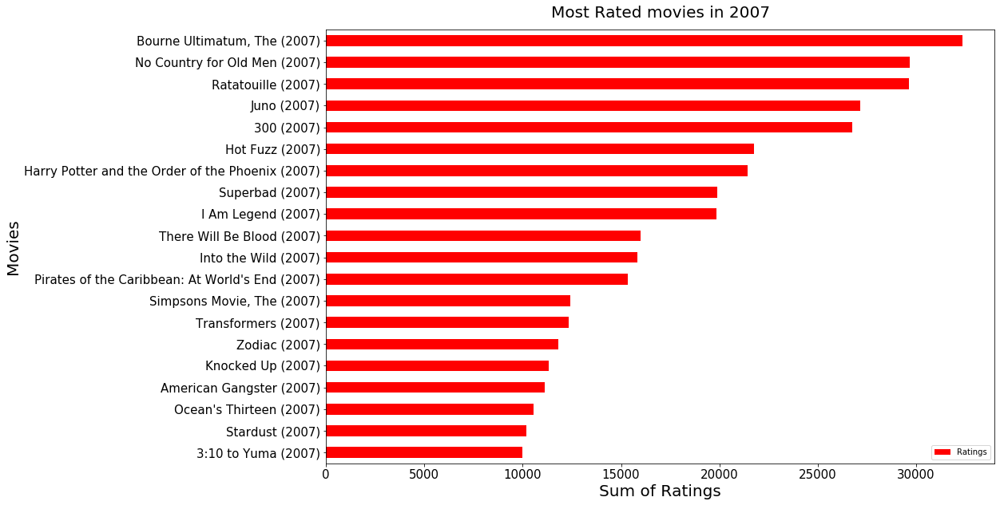

In [9]:
#call the function for year 2007
movie_2007 = movie_by_year(train_joined, '2007')
#plot the data
movie_2007.plot(kind = 'barh', color = 'red',
                figsize =(15,10),
                fontsize = 15)
#name the axis and also the plot
plt.xlabel('Sum of Ratings', size =20);
# name the y label and increase fontsize
plt.ylabel('Movies', size = 20);
# give title to plot
plt.title('Most Rated movies in 2007', size = 20, pad = 15);

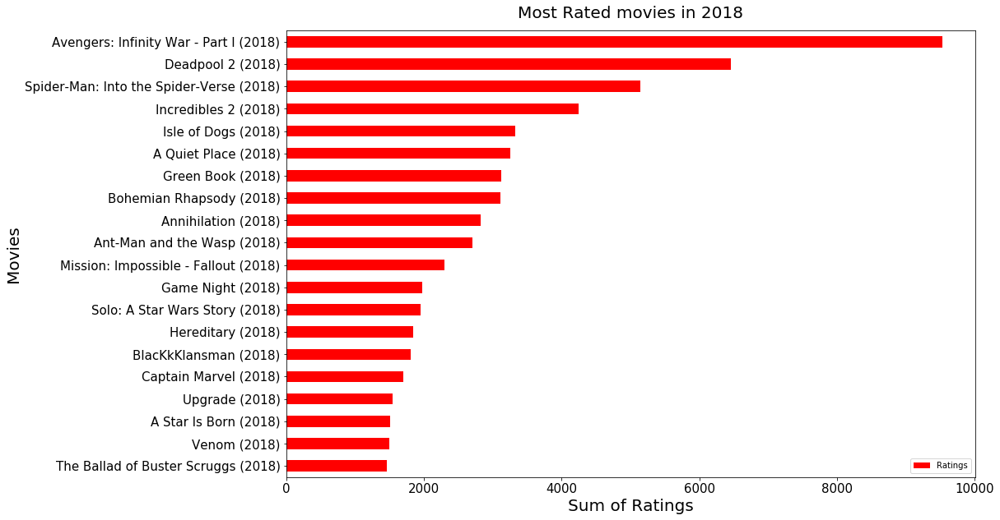

In [20]:
#call the function for year 2018
movie_2018 = movie_by_year(train_joined, '2018')
#plot the data
movie_2018.plot(kind = 'barh', color = 'red',
                figsize =(15,10),
                fontsize = 15)
#name the axis and also the plot
plt.xlabel('Sum of Ratings', size =20);
# name the y label and increase fontsize
plt.ylabel('Movies', size = 20);
# give title to plot
plt.title('Most Rated movies in 2018', size = 20, pad = 15);

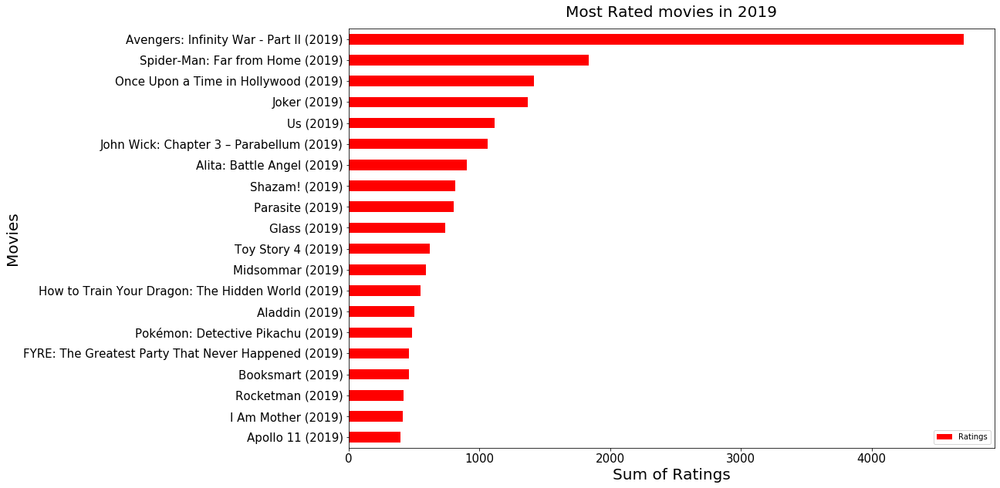

In [21]:
#call the function for year 2019
movie_2020 = movie_by_year(train_joined, '2019')
#plot the data
movie_2020.plot(kind = 'barh', color = 'red',
                figsize =(15,10),
                fontsize = 15)
#name the axis and also the plot
plt.xlabel('Sum of Ratings', size =20);
# name the y label and increase fontsize
plt.ylabel('Movies', size = 20);
# give title to plot
plt.title('Most Rated movies in 2019', size = 20, pad = 15);

## Total Movies Released by year

In [22]:
train_joined.head()

,userId,movieId,rating,title,genres,year
502801,1,296,5.0,Pulp Fiction (1994),Comedy Crime Drama Thriller,1994
6852635,1,665,5.0,Underground (1995),Comedy Drama War,1995
6086993,1,899,3.5,Singin' in the Rain (1952),Comedy Musical Romance,1952
6325668,1,1175,3.5,Delicatessen (1991),Comedy Drama Romance,1991
5047680,1,1217,3.5,Ran (1985),Drama War,1985


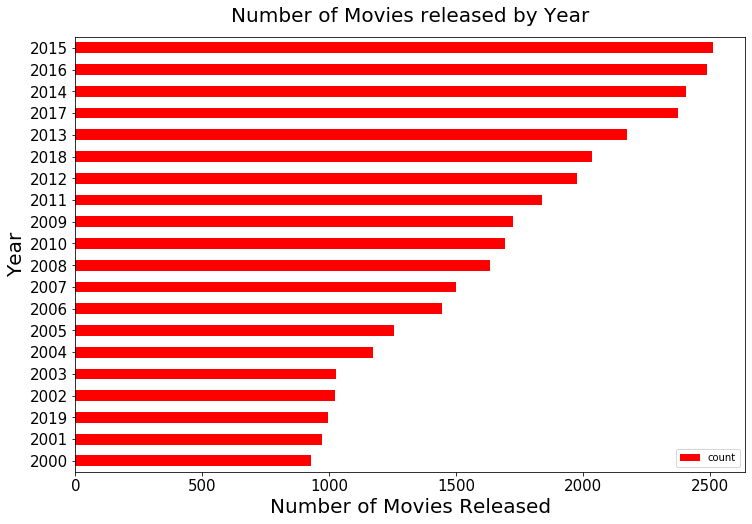

In [46]:
# perform a groupby to get the count of all movies released in a year as a feature called count
release_by_year = movies.groupby(['year'])[['year']].count().rename(columns = {'year':'count'}).reset_index()
#first column contains movies without date, so we drop it and also sort the table in descending order of counts
release_by_year = release_by_year.iloc[1:,:].sort_values(by='count', ascending = False).set_index('year')
#select the top 20 data and sort in table in descending order for the plot
release_by_year = release_by_year[:20].sort_values(by='count')
release_by_year.plot(kind ='barh',color = 'red',
                     figsize =(12,8),
                     fontsize = 15)
#name the axis and also the plot
plt.xlabel('Number of Movies Released', size =20);
# name the y label and increase fontsize
plt.ylabel('Year', size = 20);
# give title to plot
plt.title('Number of Movies released by Year', size = 20, pad = 15);

From the bar graph, we can deduce that the number of movies released has seen a rapid increase in size, with the turn in the amount of movies produced occuring in the early 2000's. We ca attribute this fact to the emergence of new technologies that make shooting a movie seemless, and the increased number of people who watch these movies, little woonder the movie industry in america (Hollywood) is a billion dollar enterprise that continues to grow rapidly as the years go by.

Also apart from the clear progression we could see from the graph about the amount of movies produced per year, one might notice that year `2018` and `2019` are lowly ranked in the ,ovie production table,this is no cause for alarm, as we can attribute this to the missing release dates in the movies table that was mentioned earlier before.

## Links Data

In [15]:
links.head()

,movieId,imdbId,tmdbId
0,1,114709,862.0
1,2,113497,8844.0
2,3,113228,15602.0
3,4,114885,31357.0
4,5,113041,11862.0


In [47]:
#use the info method to check the table properties
links.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62423 entries, 0 to 62422
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   movieId  62423 non-null  int64  
 1   imdbId   62423 non-null  int64  
 2   tmdbId   62316 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 1.4 MB


In [11]:
#check for sum of missing data
links.isna().sum()

movieId      0
imdbId       0
tmdbId     107
dtype: int64

The `links` Data has `62423 observations` and `features` all of numerical format `int64` and `float64`. The data is a map between each movie in the movies data represented by the movieId which serves as a `foreign key` on the links table, and the movieId on the movies table which serves as the `primary key` if we want to perform a merge operation.

We can get the IMDBid and TMDBid of each movie from this table. the TMDBId feature in the links table has a total of `107 missing values`, since these values represent a unique identifier for a movie, we cannot replace the missing values with the mean of the median of the `tmbdid`, instead we would have to drop them as they represent only `0.17%` of the whole data, and hence we would not lose much information from the data.

Below we drop these values, and perform an inner join of the links table to the `movies` table since we want to retain all the available fields in both table.

In [8]:
#drop missing values
links.dropna(inplace = True)
#confirm that the drop was succesful
links.isna().sum()

movieId    0
imdbId     0
tmdbId     0
dtype: int64

In [9]:
#perform inner merge on movieId
movie_link = pd.merge(links , movies , how = 'inner', on='movieId')
#check shape of the data
print(movie_link.shape)
#check the first five columns of the new table
movie_link.head()

(62316, 6)


,movieId,imdbId,tmdbId,title,genres,year
0,1,114709,862.0,Toy Story (1995),Adventure Animation Children Comedy Fantasy,1995
1,2,113497,8844.0,Jumanji (1995),Adventure Children Fantasy,1995
2,3,113228,15602.0,Grumpier Old Men (1995),Comedy Romance,1995
3,4,114885,31357.0,Waiting to Exhale (1995),Comedy Drama Romance,1995
4,5,113041,11862.0,Father of the Bride Part II (1995),Comedy,1995


## IMDB data

In [17]:
#view first five rows of imdb data
imdb.head()

,movieId,title_cast,director,runtime,budget,plot_keywords
0,1,Tom Hanks|Tim Allen|Don Rickles|Jim Varney|Wal...,John Lasseter,81.0,"$30,000,000",toy|rivalry|cowboy|cgi animation
1,2,Robin Williams|Jonathan Hyde|Kirsten Dunst|Bra...,Jonathan Hensleigh,104.0,"$65,000,000",board game|adventurer|fight|game
2,3,Walter Matthau|Jack Lemmon|Sophia Loren|Ann-Ma...,Mark Steven Johnson,101.0,"$25,000,000",boat|lake|neighbor|rivalry
3,4,Whitney Houston|Angela Bassett|Loretta Devine|...,Terry McMillan,124.0,"$16,000,000",black american|husband wife relationship|betra...
4,5,Steve Martin|Diane Keaton|Martin Short|Kimberl...,Albert Hackett,106.0,"$30,000,000",fatherhood|doberman|dog|mansion


In [10]:
#convert title_cast to strings
imdb['title_cast'] = imdb.title_cast.astype(str)
#join cast first and last name and return only the first 6 casts
imdb['title_cast'] = imdb.title_cast.apply(lambda x: "_".join(i.lower() for i in x.split()[:7]))
#replace pipes with white space
imdb['title_cast'] = imdb.title_cast.apply(lambda x: " ".join(i for i in x.split('|')))
#clean the budget remove commas and $ sign
imdb['budget'] = imdb.budget.replace('\D','', regex =True)
#remove poles from plot keyword
imdb['plot_keywords'] = imdb.plot_keywords.apply(lambda x: " ".join(str(x).split('|')))
imdb.head()

,movieId,title_cast,director,runtime,budget,plot_keywords
0,1,tom_hanks tim_allen don_rickles jim_varney wal...,John Lasseter,81.0,30000000,toy rivalry cowboy cgi animation
1,2,robin_williams jonathan_hyde kirsten_dunst bra...,Jonathan Hensleigh,104.0,65000000,board game adventurer fight game
2,3,walter_matthau jack_lemmon sophia_loren ann-ma...,Mark Steven Johnson,101.0,25000000,boat lake neighbor rivalry
3,4,whitney_houston angela_bassett loretta_devine ...,Terry McMillan,124.0,16000000,black american husband wife relationship betra...
4,5,steve_martin diane_keaton martin_short kimberl...,Albert Hackett,106.0,30000000,fatherhood doberman dog mansion


In [11]:
#number of unique movies in imdb
imdb.movieId.nunique()

27278

In [13]:
#description of imdb data
imdb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27278 entries, 0 to 27277
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   movieId        27278 non-null  int64  
 1   title_cast     27278 non-null  object 
 2   director       17404 non-null  object 
 3   runtime        15189 non-null  float64
 4   budget         7906 non-null   object 
 5   plot_keywords  27278 non-null  object 
dtypes: float64(1), int64(1), object(4)
memory usage: 1.2+ MB


In [17]:
#summary statistics of data
imdb.describe()

,movieId,runtime
count,27278.000000,15189.000000
mean,59855.480570,100.312331
std,44429.314697,31.061707
min,1.000000,1.000000
25%,6931.250000,89.000000
50%,68068.000000,98.000000
75%,100293.250000,109.000000
max,131262.000000,877.000000


In [18]:
#check for missing Data
imdb.isna().sum()

movieId              0
title_cast           0
director          9874
runtime          12089
budget           19372
plot_keywords        0
dtype: int64

The `IMDB` data has `27277 observations` and `5 features`. There is a total of `10068` missing values in the `title cast` feature, `9874` missing values in the `directors feature`, `12089` missing values in the `runtime feature`, `19372` missing values in the `budget feature` and `11078` missing values in the `plot_keyword feature`. The `movieId feature` which provides a mapping of the movies here to the movies table has no missing value.

There seems to be some outliers in the runtime values, as we have a minimum runtime of `1 minute` and maximum of `877 minutes`, these values seems abiguous, as a movie can neither have a runtime of 1 minute or 877 minutes which is approximately 14 hours.

There are two numerical features and four features of type object. Because there are no missing values in the `primary key (movieId)`, we would not drop the null values before merging, as they would not affect the merging process in any way.

Below we would perform a left join of the imdb table to the movies table, so we can have the budget, runtime and ratings data as well as the movie names all in one table.

Some of the insights we can derive from the data include the movie with the highest budget in a year, the movie that has the highest runtime, also we can compare how the runtime and budget affect the Ratings assigned to the movie.

In [11]:
movie_imdb = pd.merge(imdb,movies, on='movieId', how='left')
print(movie_imdb.shape)
movie_imdb.head()

(27278, 9)


,movieId,title_cast,director,runtime,budget,plot_keywords,title,genres,year
0,1,tom_hanks tim_allen don_rickles jim_varney wal...,John Lasseter,81.0,30000000,toy rivalry cowboy cgi animation,Toy Story (1995),Adventure Animation Children Comedy Fantasy,1995
1,2,robin_williams jonathan_hyde kirsten_dunst bra...,Jonathan Hensleigh,104.0,65000000,board game adventurer fight game,Jumanji (1995),Adventure Children Fantasy,1995
2,3,walter_matthau jack_lemmon sophia_loren ann-ma...,Mark Steven Johnson,101.0,25000000,boat lake neighbor rivalry,Grumpier Old Men (1995),Comedy Romance,1995
3,4,whitney_houston angela_bassett loretta_devine ...,Terry McMillan,124.0,16000000,black american husband wife relationship betra...,Waiting to Exhale (1995),Comedy Drama Romance,1995
4,5,steve_martin diane_keaton martin_short kimberl...,Albert Hackett,106.0,30000000,fatherhood doberman dog mansion,Father of the Bride Part II (1995),Comedy,1995


### Longest Running Movies

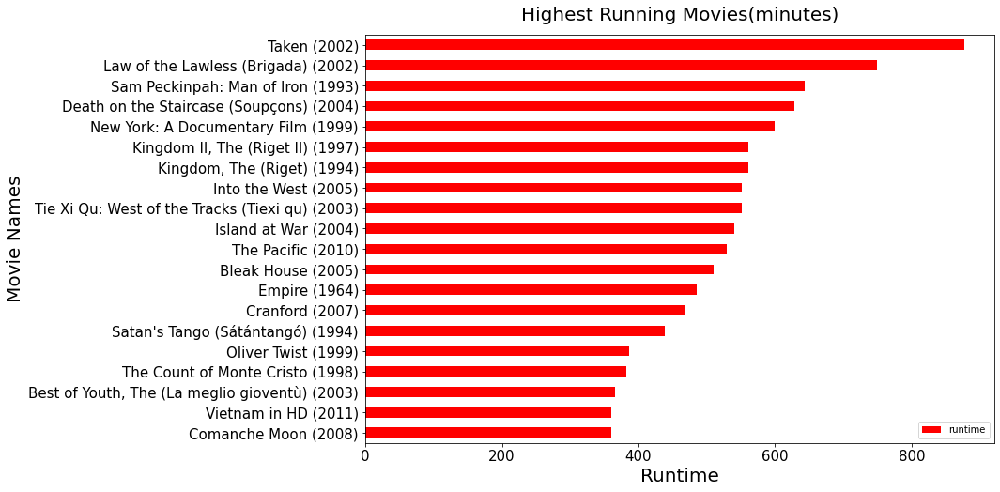

In [16]:
#select title and runtime, drop missing data, sort by runtime in descending order, and set title as index
runtime = movie_imdb[['title','runtime']].dropna().sort_values(by = 'runtime').set_index('title')
#select the top 20 running movies
longest = runtime[-20:]
longest.plot(kind ='barh',color = 'red',
                     figsize =(12,8),
                     fontsize = 15)
#name the axis and also the plot
plt.xlabel('Runtime', size =20);
# name the y label and increase fontsize
plt.ylabel('Movie Names', size = 20);
# give title to plot
plt.title('Highest Running Movies(minutes)', size = 20, pad = 15);

## Movies with the Highest Budgets

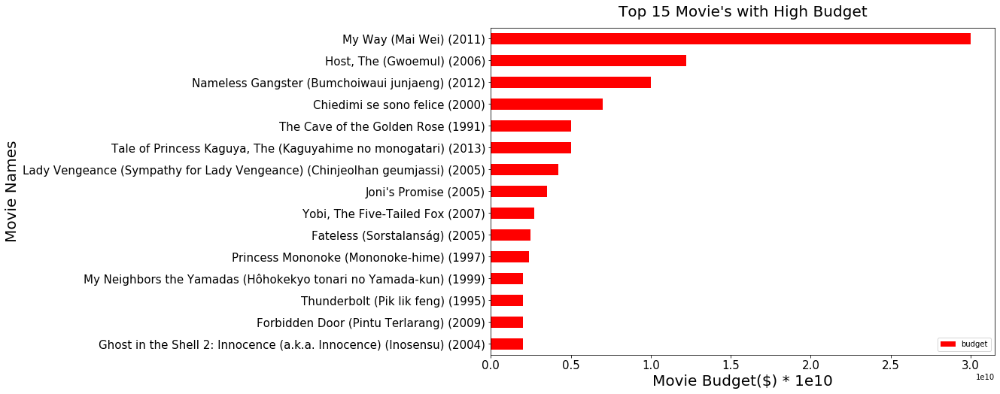

In [15]:
#select title and runtime, drop missing data, sort by runtime in descending order, and set title as index
budget = movie_imdb[['title','budget']].dropna()
#convert budgets to numerical format
budget.budget = budget.budget.apply(lambda x: int(x))
#sort the table by budget and set title as index
budget = budget.sort_values(by = 'budget').set_index('title')
#select the top 20 movies by udget
highest_budget = budget[-15:]
highest_budget.plot(kind ='barh',color = 'red',
                     figsize =(12,8),
                     fontsize = 15)
#name the axis and also the plot
plt.xlabel('Movie Budget($) * 1e10', size =20);
# name the y label and increase fontsize
plt.ylabel('Movie Names', size = 20);
# give title to plot
plt.title('Top 15 Movie\'s with High Budget', size = 20, pad = 15);

In [16]:
#use the get_movie_names function to get names of all action movies
action_movies = get_movie_names(movies,'Action')
#select only casts and movie names and set the movie names as index
cast = movie_imdb[['title_cast','title']].set_index('title')
#select action movies that are present in cast dataframe
action_in_cast = [i for i in action_movies if i in cast.index]

In [17]:
#collect only the movies that are present in both the action_movies list and the cast dataframe
action = cast.loc[action_in_cast]
#repplace missing value with np.nan so we can drop them
action.title_cast = action.title_cast.replace('nan',np.nan,regex=True)
#drop movies without cast
action = action.dropna()
action.head()

,title_cast
title,
"Four, The (Si da ming bu) (2012)",chao_deng yifei_liu ronald_cheng collin_chou a...
MacGruber (2010),will_forte kristen_wiig ryan_phillippe val_kil...
Berserk: The Golden Age Arc 2 - The Battle for Doldrey (2012),carrie_keranen orion_acaba chris_jai_alex g.k....
Demolition Man (1993),sylvester_stallone wesley_snipes sandra_bulloc...
2010: Moby Dick (2010),barry_bostwick renée_o'connor matt_lagan adam_...


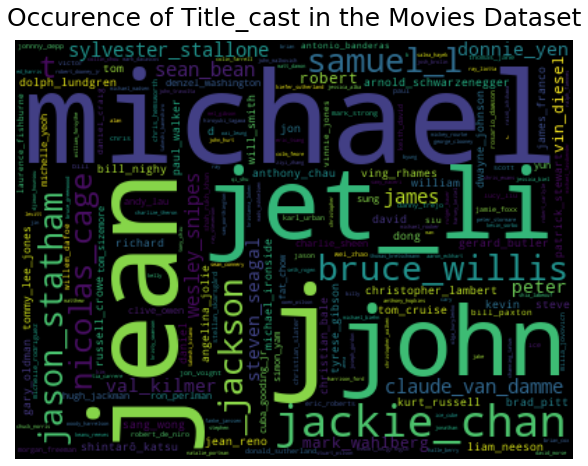

In [20]:
word_cloud(action, 'title_cast')

## Tags Data

In [36]:
# check the data types and shape of table
tags.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1093360 entries, 0 to 1093359
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype 
---  ------     --------------    ----- 
 0   userId     1093360 non-null  int64 
 1   movieId    1093360 non-null  int64 
 2   tag        1093344 non-null  object
 3   timestamp  1093360 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 33.4+ MB


In [37]:
#check for missing values
tags.isna().sum()

userId        0
movieId       0
tag          16
timestamp     0
dtype: int64

The tags table has `3 numerical` features and one text feature. There are total of `16 missing values` in the tag column, to handle these missing values we shall fill the tags with an empty string, this is because it is best for a movie to have no tags associated with it than to assign it a tag that belongs to another movie if we apply the mode imputation method. The numerical columns `movieId` and `userId` represents the movie and user who assigned the tag to that movie, tags are what users feels about a movie, from the data we could see that single user can assign multiple tags to the same movie. The `timestamp` feature is the time the tag was assigned to the movie by the user.

The text in the tag column are separates by white spaces and hifins, before we go ahead and use these tags for visualization, we must first replace the white spaces and hifins with and underscore, so that the tags don't get counted as individual entities.

To achieve these we use the string method split, join and a lambda function to join the text. Also we have to device a method to join all the tags assigned by a user to the movie, here we do not care about the user that assigned the tag, what we want are the tags associated with a particular movie.

In [10]:
#Replace all "-" with "_"
tags['tag'] = tags.tag.apply(lambda x: "_".join(str(x).split('-')))
# remove white space between tags
tags['tag'] = tags.tag.apply(lambda x: "_".join(str(x).split(' ')))

In [11]:
#handle missing data
tags['tag'] = tags.tag.fillna('')
# drop timestamp feature
tags.drop(['timestamp'], axis = 1, inplace = True) #'userId',
# confirm there are no missing data
tags.isna().sum()

userId     0
movieId    0
tag        0
dtype: int64

In [19]:
# check the newly replaced tags data
tags.head()

,userId,movieId,tag,timestamp
0,3,260,classic,1439472355
1,3,260,sci-fi,1439472256
2,4,1732,dark comedy,1573943598
3,4,1732,great dialogue,1573943604
4,4,7569,so bad it's good,1573943455


In [12]:
def join_tags(data):
    #create dictionary to store movie_id and the tags
    #as key value pairs
    movie_dict = {}
    #iterate inside the dataframe to get tags and movieId
    for ind,col in data.iterrows():
        #check if movieId is not in the dictionary
        if (col['movieId'], col['userId']) not in movie_dict.keys():
            #add movieId to dictionary with its value as a set to store tags
            #we used set so that all the tags would be unique and not repeated
            movie_dict[(col['movieId'],col['userId'])] = set()
        #for each movieId add the tags in lower case
        movie_dict[(col['movieId'],col['userId'])].add(str(col['tag']).lower())
     # create datframe from the moviId and tags   
    df = pd.DataFrame({'userId': [i[1] for i in movie_dict.keys()],
                       'movieId':[i[0] for i in movie_dict.keys()],
                       'tag': movie_dict.values()})
    
    #convert tags from set to strings
    df.tag = df.tag.apply(lambda x: ", ".join(x))
    return df
            

In [13]:
#call the join_tags function and assign to variable new_tags
new_tags = join_tags(tags)
#show the first five rows of new table
new_tags.head()

,userId,movieId,tag
0,3,260,"sci_fi, classic"
1,4,1732,"great_dialogue, dark_comedy"
2,4,7569,so_bad_it's_good
3,4,44665,unreliable_narrators
4,4,115569,tense


## Joining movies and tags tables

Now with the unique tags for each movie sorted out, we can join the new_tags table to the movies table to form a single unit, performing a merge on the movieId column.

In [14]:
#Merge new_tags table to movie table on movieId
movies_tags = pd.merge(new_tags,movies, on = 'movieId', how = 'inner')
movies_tags.head()

,userId,movieId,tag,title,genres,year
0,3,260,"sci_fi, classic",Star Wars: Episode IV - A New Hope (1977),Action Adventure Sci_Fi,1977
1,110,260,"space_adventure, adventure, action, fantasy",Star Wars: Episode IV - A New Hope (1977),Action Adventure Sci_Fi,1977
2,257,260,"good_vs_evil, classic_sci_fi",Star Wars: Episode IV - A New Hope (1977),Action Adventure Sci_Fi,1977
3,264,260,"oldie_but_goodie, scifi_cult, aliens, space, s...",Star Wars: Episode IV - A New Hope (1977),Action Adventure Sci_Fi,1977
4,339,260,"oldie_but_goodie, space_adventure",Star Wars: Episode IV - A New Hope (1977),Action Adventure Sci_Fi,1977


## Genome Tags table

In [15]:
#view first five rows
genome_tags.head()

,tagId,tag
0,1,007
1,2,007 (series)
2,3,18th century
3,4,1920s
4,5,1930s


In [31]:
#check table properties
genome_tags.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1128 entries, 0 to 1127
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   tagId   1128 non-null   int64 
 1   tag     1128 non-null   object
dtypes: int64(1), object(1)
memory usage: 17.8+ KB


The genome_tags table is has `1127 observations` and two features one of type `int64` and the other of type `object`. There are no missing values in the data. the `tag` feature contains the tags assigned to a movie, and the `tagId` are the numerical mappings of each tag. To make meaning out of this data, we have to join the genome_tags table to a table that has tagId as the primary key.

## Genome Score table

In [23]:
#check first five rows
genome_score.head()

,movieId,tagId,relevance
0,1,1,0.02875
1,1,2,0.02375
2,1,3,0.06250
3,1,4,0.07575
4,1,5,0.14075


In [33]:
#view table properties
genome_score.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15584448 entries, 0 to 15584447
Data columns (total 3 columns):
 #   Column     Dtype  
---  ------     -----  
 0   movieId    int64  
 1   tagId      int64  
 2   relevance  float64
dtypes: float64(1), int64(2)
memory usage: 356.7 MB


In [34]:
#check for missing data
genome_score.isna().sum()

movieId      0
tagId        0
relevance    0
dtype: int64

In [35]:
#check satistics of genome_score data
genome_score.describe()

,movieId,tagId,relevance
count,1.558445e+07,1.558445e+07,1.558445e+07
mean,4.602249e+04,5.645000e+02,1.163679e-01
std,5.535221e+04,3.256254e+02,1.544722e-01
min,1.000000e+00,1.000000e+00,2.500000e-04
25%,3.853750e+03,2.827500e+02,2.400000e-02
50%,8.575500e+03,5.645000e+02,5.650000e-02
75%,8.018650e+04,8.462500e+02,1.407500e-01
max,2.064990e+05,1.128000e+03,1.000000e+00


The `Genome_scores` table contains `15584448` non null values and 3 columns. The `tagId` serves as primary key to map the `tagId` from the genome_tag table, the `movieId`serve as a mapping between each tag to the movie the tag belongs to from the movies table. The relevance score has a minimum value of 0.00025 and a maximum value of 1.000 and a mean of 0.116.

These scores represents how relevant the tag assigned to a movie is, i.e how well does the tag describe the movie. We would select a relevance threshold of 0.85, we would only collect tags whose relevance values are above 0.85 and merge the relevance score to the genome tags table on tagId. This is because we want to capture only those tags that best describes each movie in the movies data.

In [16]:
#merge genome scores to tags
genome_tag_score = pd.merge(genome_tags, genome_score, how = 'left', on='tagId')
#select scores that are above threshold
above_threshold = genome_tag_score[genome_tag_score['relevance'] > 0.85]
#check shape of new data
print(above_threshold.shape)

(97550, 4)


In [17]:
#Drop duplicated values
above_threshold = above_threshold.drop_duplicates(subset = ['tagId','movieId'], keep = 'first').reset_index(drop=True)
#check shape after drop
print(above_threshold.shape)
#view first five rows
above_threshold.head()

(97550, 4)


,tagId,tag,movieId,relevance
0,1,007,10,0.99950
1,1,007,1722,0.99975
2,1,007,2376,0.99975
3,1,007,2947,0.99950
4,1,007,2948,0.99975


**Joining the Relevant tags (tags above the threshold) data to the movies data**

In [18]:
#replace whitespace with underscore
above_threshold['tag'] = above_threshold.tag.apply(lambda x: "_".join(str(x).split(' ')))
#replace "-" with "_"
above_threshold['tag'] = above_threshold.tag.replace('-','_', regex=True)
#merge movies to threshold data on movieid
movies_threshold = pd.merge(movies,above_threshold, on=['movieId'], how = 'right')
movies_threshold.sort_values(by='movieId', inplace=True, ascending=False)
print(movies_threshold.shape)
movies_threshold.head()

(97550, 7)


,movieId,title,genres,year,tagId,tag,relevance
62566,206499,Between Two Ferns: The Movie (2019),Comedy,2019,742,original,0.88600
81245,205425,Dave Chappelle: Sticks & Stones (2019),Comedy,2019,963,stand_up_comedy,0.91825
62565,205425,Dave Chappelle: Sticks & Stones (2019),Comedy,2019,742,original,0.91200
31302,204704,Ready or Not (2019),Comedy Horror Thriller,2019,374,family,0.88600
66924,204704,Ready or Not (2019),Comedy Horror Thriller,2019,801,pornography,0.85725


In [48]:
#number of unique values
movies_threshold.nunique()

movieId      13084
title        13081
genres        1047
year           109
tagId         1087
tag           1081
relevance      601
dtype: int64

Looking at the joined data we can see that the tags for a movie are recorded as individual observations in the dataset, this can be confirmed from the fact that the data has `97550` observations, but the number of unique movies are `13084`.We want all the tags associated with a movie to be on the same row as the movie. To achieve this, we have written a helper function called join tags, after the application of the function we expect the data to have `13084` observations.

In [19]:
#create join tags function
def join_tags(data):
    #create dictionary to store movie_id and the tags
    #as key value pairs
    movie_dict = {}
    #iterate inside the dataframe to get tags and movieId
    for ind,col in data.iterrows():
        #check if movieId is not in the dictionary
        if (col['movieId'], col['title']) not in movie_dict.keys():
            #add movieId to dictionary with its value as a set to store tags
            #we used set so that all the tags would be unique and not repeated
            movie_dict[(col['movieId'],col['title'])] = set()
        #for each movieId add the tags in lower case
        movie_dict[(col['movieId'],col['title'])].add(str(col['tag']).lower())
     # create datframe from the moviId and tags   
    df = pd.DataFrame({'title': [i[1] for i in movie_dict.keys()],
                       'movieId':[i[0] for i in movie_dict.keys()],
                       'tag': movie_dict.values()})
    
    #convert tags from set to strings
    df.tag = df.tag.apply(lambda x: " ".join(x))
    return df

In [20]:
#call join_tags function
movies_threshold = join_tags(movies_threshold)
movies_threshold.shape

(13084, 3)

## Feature Engineering

In this section we try to prepare the dataset for modelling, this is where we try and see which two features when joined might help a machine learning model perform optimally in making predictions. Most of the mergings have already been done previously in the EDA and preprocessing step, so we would just go ahead and apply other feature engineering tasks like vectorization of text data, and creating a user-movie-rating utility table to help out in the building of a recommender system.

we want to build a `Collaborative` and a `Content Based` recommender system, hence we would prepare the data and name variables to hold the dataset for these recommender systems. For the `Collaborative System` we need only a utility matrix of `userId's`, `movieId's` and the `ratings` assigned to a movie by each user, we also need the `names` of the movie represented by the movieid's so we can return the movie's name as recommendations and not the id's. For the`Content Based` recommender, we need to compute the similarity of a movie to other movies, this can be achieved by collecting attributes of a movie like it's `tags`, `producer or director`, `genre` and computing the cosine similarity of a movie to other movies based on these attributes. More explanation of the underlying concepts to be covered later in the modelling phase. For the collaborative recommender we would try two approaches;
- Algorithmic approach: which involves a manual computation of recommendations based on a utility matrix of userId, movieId and ratings.
- Model based approach: which involves the use of ready made python package to build a useri-movie ratings predictor.

and for the content based recommender we would build a recommender based on:
- genres
- tags
- combination of tags and genres

**Collaborative filtering data (Algorithmic Approach)**

In [28]:
#join train_joined data to new_tag data
train_data = pd.merge(new_tags,train_joined, on=['userId','movieId'], how = 'inner') 
print(train_data.shape)
train_data.head()

(84506, 7)


,userId,movieId,tag,rating,title,genres,year
0,20,1210,bah,5.0,Star Wars: Episode VI - Return of the Jedi (1983),Action Adventure Sci_Fi,1983
1,68,3481,music,4.5,High Fidelity (2000),Comedy Drama Romance,2000
2,87,1127,"amazing photography, director: james cameron, ...",5.0,"Abyss, The (1989)",Action Adventure Sci_Fi Thriller,1989
3,87,102445,"inferior sequel, setting:london (uk) (future),...",1.0,Star Trek Into Darkness (2013),Action Adventure Sci_Fi IMAX,2013
4,91,1719,"atmospheric, small town, based on a book, ince...",3.0,"Sweet Hereafter, The (1997)",Drama,1997


In [38]:
#check value distribution
train_data.nunique()

userId     162541
movieId     48213
rating         10
dtype: int64

In [29]:
#name variable for the target columns
cols = ['userId','movieId','title','rating']
#select the target columns
df_colla = train_data[cols]

In [30]:
#create utility matrix from data using title, userId and rating
collaborative_matrix = df_colla.pivot_table(columns=['title'],
                             index = ['userId'],
                             values='rating') 
# view shape of matrix
collaborative_matrix.shape

(9130, 14572)

In [43]:
#view utility matrix first five columns
collaborative_matrix.head()

title,#1 Cheerleader Camp (2010),#FollowMe (2019),#realityhigh (2017),'71 (2014),'Salem's Lot (2004),"'burbs, The (1989)",(500) Days of Summer (2009),(Dis)Honesty: The Truth About Lies (2015),(Untitled) (2009),*batteries not included (1987),+1 (2013),...And Justice for All (1979),.hack Liminality: In the Case of Mai Minase,1 Buck (2017),1 Night (2017),10 (1979),10 Cent Pistol (2015),10 Cloverfield Lane (2016),10 Days in a Madhouse (2015),10 Items or Less (2006),10 Questions for the Dalai Lama (2006),10 Things I Hate About You (1999),10 Years (2011),"10,000 BC (2008)","10,000 Black Men Named George (2002)",100 Girls (2000),100 Rifles (1969),100 Yen Love (2014),100% Love (2011),"1000 Eyes of Dr. Mabuse, The (Die 1000 Augen des Dr. Mabuse) (1960)",101 Dalmatians (1996),101 Dalmatians (One Hundred and One Dalmatians) (1961),101 Dalmatians II: Patch's London Adventure (2003),101 Reykjavik (101 Reykjavík) (2000),102 Dalmatians (2000),102 Minutes That Changed America (2008),"10th Victim, The (La decima vittima) (1965)",10x10 (2018),11 Minutes (2015),"11'09""01 - September 11 (2002)",11:14 (2003),12 (2007),12 Angry Men (1957),12 Angry Men (1997),12 Chairs (1971),12 Chairs (1976),12 Dates of Christmas (2011),12 Rounds (2009),12 Strong (2018),12 Years a Slave (2013),120 Beats Per Minute (2017),127 Hours (2010),12:01 (1993),12:08 East of Bucharest (A fost sau n-a fost?) (2006),12th & Delaware (2010),13 (2010),13 Assassins (Jûsan-nin no shikaku) (2010),13 Cameras (2015),13 Eerie (2013),13 Ghosts (1960),13 Going on 30 (2004),13 Hours (2016),13 Minutes (2015),13 Moons (2002),13 Rue Madeleine (1947),13 Tzameti (2005),13 reasons why,"13th Warrior, The (1999)",14 Blades (Jin yi wei) (2010),14 Hours (Fourteen Hours) (1951),1408 (2007),1492: Conquest of Paradise (1992),15 Minutes (2001),16 Blocks (2006),17 Again (2009),1776 (1972),18 Again! (1988),18 Meals (2011),1900 (Novecento) (1976),1915 (2015),1922 (2017),1941 (1979),1984 (Nineteen Eighty-Four) (1984),1987 (2014),1987: When the Day Comes (2017),1:54 (2016),2 Bedroom 1 Bath (2014),2 Days in New York (2012),2 Days in Paris (2007),2 Days in the Valley (1996),"2 Fast 2 Furious (Fast and the Furious 2, The) (2003)",2 Guns (2013),2 ou 3 choses que je sais d'elle (2 or 3 Things I Know About Her) (1967),20 Feet from Stardom (Twenty Feet from Stardom) (2013),20 Million Miles to Earth (1957),"20,000 Days on Earth (2014)","20,000 Leagues Under the Sea (1954)",200 Degrees (2017),200 Pounds Beauty (2006),2001: A Space Odyssey (1968),2010: The Year We Make Contact (1984),2012 (2009),2016: Obama's America (2012),2036 Origin Unknown (2018),2046 (2004),2048: Nowhere to Run (2017),20th Century Women (2016),21 (2008),21 Grams (2003),21 Jump Street (2012),21 Up (1977),21 and Over (2013),21 tapaa pilata avioliitto (2013),211 (2018),22 Bullets (L'immortel) (2010),22 July (2018),22 Jump Street (2014),23 (23 - Nichts ist so wie es scheint) (1998),24 Days (2014),24 Hour Party People (2002),24 Hours to Live (2017),24: Redemption (2008),"24th Day, The (2004)",25 April (2015),25th Hour (2002),27 Dresses (2008),28 Days (2000),28 Days Later (2002),28 Up (1985),28 Weeks Later (2007),2:37 (2006),3 Beauties (2015),3 Days to Kill (2014),3 Extremes (Three... Extremes) (Saam gaang yi) (2004),3 Godfathers (1948),3 Idiots (2009),3 Musketeers (2011),3 Ninjas (1992),3 Simoa (2012),3 Women (Three Women) (1977),3-Iron (Bin-jip) (2004),30 Days of Night (2007),30 Days of Night: Dark Days (2010),30 Minutes or Less (2011),300 (2007),"300 Spartans, The (1962)",3000 Miles to Graceland (2001),300: Rise of an Empire (2014),303 (2018),3096 Days (2013),31 (2016),35 Shots of Rum (35 rhums) (2008),360 (2011),"39 Steps, The (1935)",3:10 to Yuma (1957),3:10 to Yuma (2007),"4 Horsemen of the Apocalypse, The (1962)",4 Minute Mile (2014),"4 Months, 3 Weeks and 2 Days (4 luni, 3 saptamâni si 2 zile) (2007)",4 Moons (2014),4/20 Massacre (2018),40 Days and 40 Nights (2002),"40-Year-Old Virgin, The (2005)","400 Blows, The (Les quatre cents coups) (1959

**Content Based Filtering Data**

For the content based filtering algorithm, we would build a recommender using the genres only, the tags only, the plot_keyword, the producers, and a combination of these features. Lets create variables to store these features.

In [26]:
# Join movie_treshold table and movies table to get tags and genres
content_data = pd.merge(movies_threshold,
                        movies[['movieId','genres','year']],
                        on= ['movieId'], how = 'left')
content_data.sort_values(by='movieId', inplace=True, ascending=False)
#convert content data to strings
content_data.genres = content_data.genres.astype(str)
# convert content_data to lower case
content_data.genres = content_data.genres.apply(lambda x: x.lower())
content_data['combined'] = content_data.tag + " " + content_data.genres
print(content_data.shape)
content_data.head()

(13084, 6)


,title,movieId,tag,genres,year,combined
0,Between Two Ferns: The Movie (2019),206499,original,comedy,2019,original comedy
1,Dave Chappelle: Sticks & Stones (2019),205425,stand_up_comedy original,comedy,2019,stand_up_comedy original comedy
2,Ready or Not (2019),204704,family pornography,comedy horror thriller,2019,family pornography comedy horror thriller
3,Joker (2019),204698,social_commentary visually_appealing great_act...,crime drama thriller,2019,social_commentary visually_appealing great_act...
4,In the Tall Grass,204692,weird creepy original,drama horror thriller,,weird creepy original drama horror thriller


In [32]:
#name variables to hold index, year and title
content_based_title = content_data[['title','year']]
year = content_data.year
content_index = content_data.title
content_indices = pd.Series(content_data.index, index = content_index)

**tags feature**

In [33]:
# Vectorize the tags data
tfidf_tag = TfidfVectorizer(analyzer='word', ngram_range=(1,1),
                        min_df=0, stop_words='english')
tag_feature = content_data.tag
tag_matrix = tfidf_tag.fit_transform(tag_feature)

**genres feature**

In [34]:
# Vectorize the genres data
tfidf_genre = TfidfVectorizer(analyzer='word', ngram_range=(1,1),
                        min_df=0, stop_words='english')
genre_feature = content_data.genres
genre_matrix = tfidf_genre.fit_transform(genre_feature)

**tags and genres combined**

In [30]:
# Vectorize the genres data
tfidf_combined = TfidfVectorizer(analyzer='word', ngram_range=(1,1),
                        min_df=0, stop_words='english')
combined_feature = content_data.combined
combined_matrix = tfidf_combined.fit_transform(combined_feature)

## Modelling

### Collaborative Filtering (Model Based Approach)

Collaborative filtering is a very popular recommendation algorithm that seeks to use either the similarity between users or the similarities between users-items preferences to recommend items to a user.
For the `collaborative modelling` task, and due to the size of the dataset we would be using a python package known as `surprise` which was created specifically for building recommender systems, especially when it concerns a user's rating of an item.
Surprise provides tools to evaluate, analyze and compare several algorithm's performance before actually fitting the full train data, it also provides ready-to-use predictor algorithms some of which we would fit our training data to to make recommendations.

Below we would implement a crossvalidation of 8 surprise algorithm on a subset of the train data to measure their performance and hence choose the n best to train a model on.

In [86]:
# create a list of algorithms to crossvalidate
models = [SVD(), BaselineOnly(), NMF(), SVDpp(), KNNBasic(),
          KNNWithMeans(), KNNWithZScore(),KNNBaseline()]

# select 15,000 observations of the train data
df_sample = train[['userId', 'movieId', 'rating']].sample(15000)
reader = Reader()
# prepare surprise data using load_from_df method
cross_val_data = Dataset.load_from_df(df_sample, reader)

#List to store RMSE of the models
rmse_scores = list()
#iterate inside of the models list
for model in models:
    # create crossvalidation object using 4 fold cv
    cross_validation = cross_validate(model, cross_val_data,
                                      measures=['RMSE'], cv = 4)
    # create a datasframe to store results
    result= pd.DataFrame.from_dict(cross_validation).mean(axis=0)
    # append result to dataframe
    result= result.append(pd.Series([str(model).split(' ')[0].split('.')[-1]],
                                    index=['Model']))
    # append rmse score to rmse_scores list
    rmse_scores.append(result)

output = pd.DataFrame(rmse_scores).set_index('Model').sort_values('test_rmse')
output

Estimating biases using als...
Estimating biases using als...
Estimating biases using als...
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.


,test_rmse,fit_time,test_time
Model,,,
SVDpp,1.026906,1.215514,0.034081
KNNBaseline,1.028231,3.785338,0.033497
SVD,1.029399,0.767477,0.027578
BaselineOnly,1.030773,0.054381,0.023646
KNNBasic,1.064034,3.688966,0.058552
KNNWithMeans,1.098251,3.866368,0.060451
KNNWithZScore,1.102316,4.214757,0.036988
NMF,1.106531,1.704750,0.027914


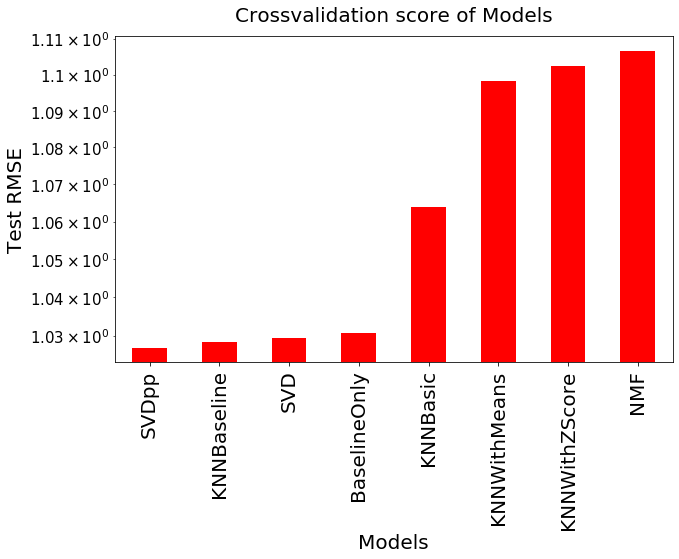

In [90]:
#plot the result data
output.test_rmse.plot(kind = 'bar', color = 'red',
                figsize =(10,6), logy =True, #use logscaling as the results
                fontsize = 15)                # are alsomt same
#name the axis and also the plot
plt.xlabel('Models', size =20);
# name the y label and increase fontsize
plt.ylabel('Test RMSE', size = 20);
plt.xticks(size = 20)
# give title to plot
plt.title('Crossvalidation score of Models', size = 20, pad = 15);

From the `cross_validation` score of the algorithms above, we can clearly see that `SVD`, `SVDpp`, `KNNBaseline`, `BaselineOnly` outperforms the other algorithms, so we would go ahead and fit the train data to these models only and evaluate the performance on thetestset.

In [31]:
#select train feature from train data
train_data = train[['userId','movieId','rating']]
# split the data
trainset, testset = train_test_split(train_data, test_size =0.2, random_state=28)
# name variable for true ratings value
y_true = testset['rating']

In [32]:
## Preparation of surprise data
reader = Reader()
#load data using load_from_df method
train_df = Dataset.load_from_df(trainset, reader)
train_df = train_df.build_full_trainset()

In [33]:
# define function to test models and return rmse score
def evaluate_model(model, test_data, y_true ):
    # make prediction
    predictions = [model.predict(row.userId,
                    row.movieId) for ind,
                    row in test_data.iterrows()]
    # collect only the predicted ratings
    pred = [i[3] for i in predictions]
    rmse  = np.sqrt(mean_squared_error(y_true,pred))
    return rmse

**Baseline Only Model**

In [34]:
#create model object
baseline = BaselineOnly(
                        bsl_options=
                        {'method': 'sgd',
                         'n_epochs': 50},
                        verbose= 1
                        )
#fit traindata to model object
baseline.fit(train_df)
#call evaluate function
base_rmse = evaluate_model(baseline, testset, y_true)
print('The RMSE score is: {}'.format(base_rmse))

Estimating biases using sgd...
The RMSE score is: 0.8676206100592049


In [35]:
# models parameters
base_params = {"model_type": "BaselineOnly",
          "method": 'sgd',
          "n_epochs": 50,
          }
# models evaluation mer=trics
base_metrics = {"rmse": base_rmse}

# Log parameters and metrics to comet
experiment.log_parameters(base_params)
experiment.log_metrics(base_metrics)

**SVDpp Model**

In [41]:
#create model object
svdpp = SVDpp( init_std_dev = 0.05,
                  n_epochs = 50,
                  random_state = 28)
#fit traindata to model object
svdpp.fit(train_df)
#call evaluate function
svdpp_rmse= evaluate_model(svdpp, testset, y_true)
print('The RMSE score is: {}'.format(svdpp_rmse))

In [ ]:
# models parameters
svdpp_params = {"model_type": "SVDpp",
          "init_std_dev": 0.05,
          "n_epochs": 50,
          "random_state": 28
          }
svdpp_metrics = {"rmse": svdpp_rmse}

# Log parameters and metrics to comet
experiment.log_parameters(svdpp_params)
experiment.log_metrics(svdpp_metrics)

**SVD Model**

In [16]:
#create model object
svd = SVD(lr_all = 0.006, reg_all =0.04,
          n_epochs = 50, init_std_dev =0.05)
#fit traindata to model object
svd.fit(train_df)
#call evaluate function
svd_rmse = evaluate_model(svd, testset, y_true)
print('The RMSE score is: {}'.format(svd_rmse))

The RMSE score is: 0.7986302269523302


In [20]:
svd_params = {"model_type": "SVD",
          "lr_all": 0.006,
          "reg_all": 0.04,
          "n_epochs": 50,
          "init_std_dev": 0.04
          }
svd_metrics = {"rmse": svd_rmse}

# Log parameters and metrics to comet
experiment.log_parameters(svd_params)
experiment.log_metrics(svd_metrics)

**KNNBaseline Model**

In [11]:
#create model object
knn_baseline = KNNBaseline(k = 45,
                    min_k = 10,
                    sim_options = {'name':'cosine',
                        'user_based': True},
                    bsl_options = {'method': 'sgd',
                        'n_epochs': 50},
                  )
#fit traindata to model object
knn_baseline.fit(train_df)
#call evaluate function
knn_baseline_rmse = evaluate_model(knn_baseline, testset, y_true)
print('The RMSE score is: {}'.format(knn_baseline_rmse))

In [ ]:
knn_baseline_params = {"model_type": "KNNBaseline",
          "min_k": 20,
           "sim_options": {'name':'cosine',
                           'user_based':True},
           "bsl_opttions": {'method':'sgd'},
           "n_epochs": 50,
            }
knn_baseline_metrics = {"rmse": knn_baseline_rmse}

# Log parameters and metrics to comet
experiment.log_parameters(knn_baseline_params)
experiment.log_metrics(knn_baseline_metrics)

**Collaborative Filtering (Algorithmic Approach)**

In the previous approach we developed the recommender systems using the model approach, where we used the surprise package to build a predictor that calculates what a user would rate a movie base on the similarity of that movie to the other movies that the user has seen and rated previously. In the algorithmic approach, we would build the recommender system manually by first computing a `n x n` matrix knowmn as a `utility matrix` of users, movies and ratings. We would do this by first creating a `pivot table`, then we `normalizecthe data`, and then compute the `cosine similarity`, subsequently we would write a function that manually takes a `userId` and returns the most rated predicted movies less the ones the user has actually seen and rated.

Recall that we had already created a pivot table for the collaboritive filtering algorithm in the feature engineering phase named `collaborative_matrix`, let us go ahead and use the created variable and `normalize` the data before computing the `similarity matrix`.

In [44]:
# Normalize each row (a given user's ratings) of the utility matrix
util_matrix_norm = collaborative_matrix.apply(lambda x: (x-np.mean(x))/(np.max(x)-np.min(x)), axis=1)
# Fill Nan values with 0's, transpose matrix, and drop users with no ratings
util_matrix_norm.fillna(0, inplace=True)
util_matrix_norm = util_matrix_norm.T
util_matrix_norm = util_matrix_norm.loc[:, (util_matrix_norm != 0).any(axis=0)]
# Save the utility matrix in scipy's sparse matrix format
util_matrix_sparse = sp.sparse.csr_matrix(util_matrix_norm.values)

In [45]:
# Compute the similarity matrix using the cosine similarity metric
user_similarity = cosine_similarity(util_matrix_sparse.T)
# Save the matrix as a dataframe to allow for easier indexing  
user_sim_df = pd.DataFrame(user_similarity, 
                           index = util_matrix_norm.columns, 
                           columns = util_matrix_norm.columns)

# Review a small portion of the constructed similartiy matrix  
user_sim_df[:5]

userId  87      91      114       225       233       264     294     324     \
userId                                                                         
87         1.0     0.0     0.0  0.000000  0.000000  0.000000     0.0     0.0   
91         0.0     1.0     0.0  0.000000  0.000000  0.000000     0.0     0.0   
114        0.0     0.0     1.0  0.000000  0.000000  0.000000     0.0     0.0   
225        0.0     0.0     0.0  1.000000  0.133631  0.162622     0.0     0.0   
233        0.0     0.0     0.0  0.133631  1.000000  0.000000     0.0     0.0   

userId  357     402       542     563     595     610      619       647     \
userId                                                                        
87         0.0     0.0  0.000000     0.0     0.0     0.0  0.00000  0.000000   
91         0.0     0.0  0.088281     0.0     0.0     0.0  0.13057 -0.004767   
114        0.0     0.0  0.000000     0.0     0.0     0.0  0.00000  0.000000   
225        0.0     0.0  0.000000     0.0     0.0     0.0  0.00000  0.000000   
233        0.0     0.0  0.000000     0.0     0.0     0.0  0.00000  0.000000   

userId  653     743     757     791       800     801     848       871     \
userId                                                                       
87         0.0     0.0     0.0     0.0  0.000000     0.0     0.0  0.000000   
91         0.0     0.0     0.0     0.0  0.000000     0.0     0.0  0.024465   
114        0.0     0.0     0.0     0.0 -0.199835     0.0     0.0  0.000000   
225        0.0     0.0     0.0     0.0  0.000000     0.0     0.0  0.000000   
233        0.0     0.0     0.0     0.0  0.000000     0.0     0.0  0.000000   

userId  899     951     975     997     1028      1048    1072    1122    \
userId                                                                     
87         0.0     0.0     0.0     0.0     0.0  0.000000     0.0     0.0   
91         0.0     0.0     0.0     0.0     0.0  0.000000     0.0     0.0   
114        0.0     0.0     0.0     0.0     0.0  0.000000     0.0     0.0   
225        0.0     0.0     0.0     0.0     0.0  0.000970     0.0     0.0   
233        0.0     0.0     0.0     0.0     0.0  0.003628     0.0     0.0   

userId  1224    1232    1255    1361    1367    1442    1490    1533    \
userId                                                                   
87         0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
91         0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
114        0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
225        0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
233        0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   

userId    1541    1543    1604    1616      1652    1692    1694    1696    \
userId                                                                       
87      0.000000     0.0     0.0     0.0  0.000000     0.0     0.0     0.0   
91      0.028161     0.0     0.0     0.0  0.000217     0.0     0.0     0.0   
114     0.000000     0.0     0.0     0.0  0.147339     0.0     0.0     0.0   
225     0.000000     0.0     0.0     0.0  0.000000     0.0     0.0     0.0   
233     0.000000     0.0     0.0     0.0  0.000000     0.0     0.0     0.0   

userId    1735    1800    1881    1883    1893      1899    1915    1991    \
userId                                                                       
87      0.000000     0.0     0.0     0.0     0.0  0.000000     0.0     0.0   
91     -0.046715     0.0     0.0     0.0     0.0  0.000000     0.0     0.0   
114     0.000000     0.0     0.0     0.0     0.0  0.000000     0.0     0.0   
225     0.000000     0.0     0.0     0.0     0.0  0.011339     0.0     0.0   
233     0.000000     0.0     0.0     0.0     0.0  0.042426     0.0     0.0   

userId  2019    2066    2121      2165    2277    2287    2308    2309    \
userId                                                                     
87         0.0     0.0     0.0  0.000000

In [70]:
# create a function to make recommendation from a user's Id
def collab_generate_top_N_recommendations(user, N=10, k=20):
    # Cold-start problem - no ratings given by the reference user. 
    # With no further user data, we solve this by simply recommending
    # the top-N most popular books in the item catalog. 
    if user not in user_sim_df.columns:
        return df_colla.groupby('title').mean().sort_values(by='rating',
                                        ascending=False).index[1:N].to_list()
    
    # Gather the k users which are most similar to the reference user 
    sim_users = user_sim_df.sort_values(by=user, ascending=False).index[1:k+1]
    favorite_user_items = [] # <-- List of highest rated items gathered from the k users  
    most_common_favorites = {} # <-- Dictionary of highest rated items in common for the k users
    
    for i in sim_users:
        # Maximum rating given by the current user to an item 
        max_score = util_matrix_norm.loc[:, i].max()
        # Save the names of items maximally rated by the current user   
        favorite_user_items.append(util_matrix_norm[util_matrix_norm.loc[:, i]==max_score].index.tolist())
        
    # Loop over each user's favorite items and tally which ones are 
    # most popular overall.
    for item_collection in range(len(favorite_user_items)):
        for item in favorite_user_items[item_collection]: 
            if item in most_common_favorites:
                most_common_favorites[item] += 1
            else:
                most_common_favorites[item] = 1
    # Sort the overall most popular items and return the top-N instances
    sorted_list = sorted(most_common_favorites.items(), key=operator.itemgetter(1), reverse=True)[1:N]
    top_N = [x[0] for x in sorted_list]
    return top_N

In [74]:
collab_generate_top_N_recommendations(294, 20)

['Us (2019)',
 'Nightmare Before Christmas, The (1993)',
 'Get Out (2017)',
 'Rear Window (1954)',
 'Dark Knight, The (2008)',
 'Little Shop of Horrors (1986)',
 'Kinsey (2004)',
 'Mugabe and the White African (2009)',
 'Fish Called Wanda, A (1988)',
 'Grindhouse (2007)',
 'Mother! (2017)',
 'Gladiator (2000)',
 "Howl's Moving Castle (Hauru no ugoku shiro) (2004)",
 'Spirited Away (Sen to Chihiro no kamikakushi) (2001)',
 'Beyond the Black Rainbow (2010)',
 'Coherence (2013)',
 'House (Hausu) (1977)',
 'Joker (2019)',
 'Teen Wolf (1985)']

In [75]:
#check out User 294s historical ratings
df_colla[df_colla['userId'] == 294][:][['title','rating']].sort_values(by='rating', ascending=False)[:10]

,title,rating
81,Us (2019),4.0
78,Lady Bird (2017),3.5
80,FYRE: The Greatest Party That Never Happened (...,3.5
83,In the Tall Grass,3.5
76,Sleepless in Seattle (1993),3.0
79,Vice (2018),3.0
82,Someone Great (2019),3.0
77,Kiss the Girls (1997),2.5


### Collaborative Filtering Kaggle Submission

In [39]:
# make predictions using the SVD model on the test data (5000018 observations)
predictions = [svd.predict(row.userId,
                           row.movieId) for ind,
                           row in test.iterrows()]

In [40]:
# convert the predictions result list to DataFrame
pred = pd.DataFrame(predictions)
pred.head()

,uid,iid,r_ui,est,details
0,95371.0,72641.0,None,3.765995,{'was_impossible': False}
1,85217.0,3328.0,None,3.353087,{'was_impossible': False}
2,147836.0,165.0,None,3.632380,{'was_impossible': False}
3,138648.0,54256.0,None,2.288375,{'was_impossible': False}
4,86642.0,4970.0,None,1.000000,{'was_impossible': False}


In [41]:
# Rename the column names to standard format for submission
pred = pred.rename(columns={'uid':'userId',
                            'iid':'movieId',
                            'est':'rating'}).drop(columns =['details','r_ui'])
# check the first five rows of changed data
pred.head()

,userId,movieId,rating
0,95371.0,72641.0,3.765995
1,85217.0,3328.0,3.353087
2,147836.0,165.0,3.632380
3,138648.0,54256.0,2.288375
4,86642.0,4970.0,1.000000


In [60]:
# join userid and movieid into a pair and assign column to id
pred['Id'] = pred['userId'].map(str) +'_'+ pred['movieId'].map(str)
# drop userId and movieId columns
submission = pred.drop(columns = ['userId','movieId'])
# rearrange the column order
submission = submission[['Id','rating']]
# view the first five rows
submission.head()

,Id,rating
0,1_2011,3.072399
1,1_4144,4.326607
2,1_5767,3.828678
3,1_6711,4.240413
4,1_7318,2.955046


In [74]:
# instatiate zipfile saving dictionary
compression_opts = dict(method='zip',
                        archive_name ='3rd_surprise.csv')
# save the submission file directly as a zipped file because of size
submission.to_csv('3rd_surprise.zip', compression=compression_opts, index=False)

In [42]:
# name variable for true ratings from testdata in train_test_split
y_true = testset['rating']
pred_ = [svd.predict(row.userId,
                    row.movieId) for ind,
                    row in testset.iterrows()]

# collect only the predicted ratings from pred_
pred = [i[3] for i in pred_]
# compute RMSE of test data
rmse  = np.sqrt(mean_squared_error(y_true,pred))
print('The RMSE score is: {}'.format(rmse))

The RMSE score is: 0.7976460621692169


**Pickling The Model**

In [45]:
#Name to save model as 
file = 'surprise.SVD.pkl'
with open(file, 'wb') as f:
    pickle.dump(svd,f)

## Content Based Filtering

Content based filtering uses the similairties in the attributes of a given item to make recommendations to a user based on the users preference. For example in the context of a movie, if a user `U` likes a movie named `X` and movie `X` has the following attributes or properties;
- genres: Action, Drama, Sci-Fi
- producer: Christopher Nolan

and there are two other movies `Y` and `Z` with properties;
- genres:Animation, Romance, Adventure
- producer: Kieffer Sutherland

and Z
- genres: Sci-fi, Action, Thriller
- producer: Andy Scott

Given the similarities in the attributes (genres) of movie `Z` to movie `X`, user `U` would be perceived to like movie `Z` better than movie `Y`and hence would be recommended movie `Z` first before movie`Y`. Other factors like the producer of a movie, the cast, te tags associated with the movie are also attributes that can be used in conjuction with a user's preference to make recommendations.  With these said, let us go ahead and build some content based recommendation systems on the movie data using, the `tags`, `producers` and the `genres` of a movie.

Recall that we had prepared the datasets for these modellings tasks in the feature engineering phase, where we first joined the dataset and then vectorized the dataset,so we just go ahead and use the vectorized data to build the content based recommender systems utility matrix. 



**Tags Content Based Model**

In [110]:
# Build similarity matrix with vectorized tags data
tags_similarity = cosine_similarity(tag_matrix, 
                                         tag_matrix)
tags_similarity.shape

(13084, 13084)

In [24]:
# define function to make recommendations of movies
def generate_recommendations(movie_title, similarity_matrix, N =10):
    #Use try except block so we don't get keyerror
    #when a users movie choice doesn't exist 
    try:
        idx = content_indices[movie_title]
        # Extract all similarity values computed with the reference movie title
        sim_scores = list(enumerate(similarity_matrix[idx]))
        # Sort the values, keeping a copy of the original index of each value
        # and return only the index values of movies whose similarity score is above 0.5
        movie_indices = [i[0] for i in sorted(sim_scores,
                                              key=lambda x: x[1],
                                              reverse=True) if i[1] >= 0.5]
        # sort the recommended movies from most recent year to least recent
        movie = content_based_title.loc[movie_indices]#.sort_values(by = 'year', ascending= False)
        # return the movie titles excluding the reference movie
        return movie.title[1:N]
    except IndexError:
        print(movie_title + "Not in the Movie DataBase")
    

In [111]:
generate_recommendations("GoldenEye (1995)",tags_similarity, N=10)

8113                     Die Another Day (2002)
6886                           Octopussy (1983)
10015    On Her Majesty's Secret Service (1969)
11674                Tomorrow Never Dies (1997)
3906                   Quantum of Solace (2008)
9684               Living Daylights, The (1987)
1106                             Spectre (2015)
10551                    Licence to Kill (1989)
10552                 For Your Eyes Only (1981)
Name: title, dtype: object

**Genres Content Based Recommender**

In [32]:
# Build similarity matrix with vectorized genres data
genres_similarity = cosine_similarity(genre_matrix, 
                                         genre_matrix)
genres_similarity.shape

(13084, 13084)

In [74]:
generate_recommendations("GoldenEye (1995)",genres_similarity, N=10)

99                Mission: Impossible - Fallout (2018)
463                              The Great Wall (2016)
1737         Mission: Impossible - Rogue Nation (2015)
3141                           Expendables, The (2010)
3634    Raiders of the Lost Ark: The Adaptation (1989)
3906                          Quantum of Solace (2008)
4732                              Casino Royale (2006)
4944                    Mission: Impossible III (2006)
6837                           On Deadly Ground (1994)
6883                      Never Say Never Again (1983)
Name: title, dtype: object

**Combination of Tags and Genres content Based Recommender**

In [33]:
# Build similarity matrix with vectorized combined data
combined_similarity = cosine_similarity(combined_matrix, 
                                         combined_matrix)
combined_similarity.shape

(13084, 13084)

In [34]:
generate_recommendations("GoldenEye (1995)",combined_similarity, N=10)

8113                     Die Another Day (2002)
6886                           Octopussy (1983)
10015    On Her Majesty's Secret Service (1969)
11674                Tomorrow Never Dies (1997)
9684               Living Daylights, The (1987)
3906                   Quantum of Solace (2008)
10551                    Licence to Kill (1989)
6883               Never Say Never Again (1983)
10552                 For Your Eyes Only (1981)
Name: title, dtype: object

<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

**Collaborative Filtering**

Amongst the four surprise models that was built, the `Single Value Decomposition` model had the highest performance in predicting the ratings score of a user-movie combination. The `SVD` model recorded an `RMSE` of 0.79 which is significantly smaller than the second best model `BaselineOnly` which had an `RMSE` score of 0.87. With these results we have selected the `SVD` model as the algorithm that would be used for our recommender system.

**Content Based Filtering**

For the content based filtering systems, we tried three approaches each of which involved using the `tags` only, `genres` only and a combination of the `tags and genres`. Looking closely at the recommendations made by the 3 approaches when a user indicated `GoldenEye (1995)` which is a `james bond (007)` based movie that is predominantly of genre type `action`, `thriller`, `romance` and would have tags like `spy`, `007`, `action thriler` associated with it, as their favourite movie, the `genres` recommender top ten results were filled with movies of similar or same tags and genres as the reference movie, the downside of it's prediction is that itv was too exact, as it returned mostly movies that are sequels to the reference movie.

The `genres` recommender had some pretty good recommendations, and seems to have done a better job in generalizing in it's recommendations. Taking a closer look at the recommendations, we would see that there is a perfect blend of sequels to the reference movie as well as movies that have no ties with the reference movie but share a similar storyline or content.

The combination of the `genres and tags` has a similar output as the `tags` only model, as most of the returned recommendations are also sequels of the reference movie. This behavior can be attributed to the fact that the tags are more dominant in the genres-tags pairing, what is meant by this is that there are more tags assigned to a movie compared to the genres associated with a movie. 

<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, you are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

**Collaborative Recommender**

Collaborative Recommender is a filtering system that works by filtering out items that a user might like based on the similarities the user shares with other users and the items they have rated highly. Our approach here is to compute a similarity matrix using cosine similarities of users and their correspondings ratings of the movies in the movie database. The similarity matrixis a n by n sparse matrix, this is because a single user wouldn't have seen all the movies in the database, and hence we would have a zero value on the matrix where a user intersects with a movie they haven't seen. 

With the similarity matrix computed, we can then predict the ratings a user would assign a movie. The algorithm we used here is the **Single Value Decomposition** or `SVD`, which is a decomposition of a matrix `M` which is a utility matrix of `users`, `items` and the `ratings` assigned by each user to an item.

The Decomposed ratings matrix `M` is a matrix used in the collaborative recommender system with the aim of revealing the latent factors in `M` by minimizing the `RMSE` of the predicted `user-movie` rating score.

**Content Based Recommender**

Every movie has a unique attribute like the producer, the genres, the tags that describes it,The element of these unique attributes can sometiimes intersect between movies, i.e two unique movies can have the same genres and also the same producers or production crew. The approach we followed here is to exploit these intersected similarities in a movie's attributes, and hence make recommendations of similar movies to a user based on their favourite movie's similarity score to the other movies in the database. we tried out three different approaches to see which one would yield the most promising results;

- `Genres` firstly we tried using the genres of a movie: by using the genres we opt to calculate the cosine similarity of the vectorized genres of the movies and subsequently compute the movies that has the highest similarity scores with a reference movie. The similarity score is a single float number that ranges from 0 to 1, with 1 being the highest number.
- `Tags` The dataset has a tags data that indicates the tags given to a movie by users, the tags also has a `relevance` score which tells us how relevent an assigned tag is to the movie. To use the tags, we set a threshold of `0.9` in the `relevance` score such that if an assigned tag does not have a relevance score of up to 0.9, it is considered as irrelivant and hence dropped.with this approach we would be sure that the tags used to build the recommender system describes the movie almost perfectly. The other steps are the same as the `genres` approach.
- `Combination of Genres and Tags`: with this approach, we join the tags and also the genres in a movie to calculate the similarity matrix of that movie to the others.The logic behind this approach is that two movies can have exactly the same set of genres but differ in the tags assigned to them, hence we seek to explore the dissimilarity in the tags to see if the recommender would not only recommend movies based on their genre similarity but also take into account the tags assigned to them.

## Conclusion

In this Notebook, we have been able to impliment `content based` and `collaborative` filterings techniques for movies recommendations. For the `collaborative based` approach, we implimented the `algorithmic` approach which seeks to exploit the similarity between users and hence use their ratings history to give recommendations.To carry this out we first needed to create a utility `similarity matrix` of `userid`, `movieid` and `ratings` and sort the matrix in descending order of similarity values. For the `model` based approach, much of the steps carried out in the `algorithmic` approach are handled by the use of a package known as `surpeise` which is built specifically for creating collaborative recommendation models.

In the Content based recommender, we exploited the use of the `tags`, `genres` and a combination of `tags & genres`. all three approaches did a good job but have slightly different results in their Top_N recommended movies.